In [1]:
import os.path as path
import os
up = path.abspath(path.join('FastRCNNPredictor.ipynb' ,"../../../.."))

In [2]:
up

'c:\\Users\\shaur\\OneDrive\\Documents'

In [3]:
working_dir = up + '/GitHub/detect-waste/FastRCNN/'
data_file = up + '/GitHub/detect-waste/annotations/annotat.csv'
data_folder = up + '/GitHub/detect-waste/TACO/data/'
model_path = up + '/GitHub/detect-waste/models/model.pth'
num_classes = 28

In [4]:
os.chdir(working_dir)

In [5]:
import numpy as np
import os
import torch
import pycocotools
import torch.utils.data
from PIL import Image
import pandas as pd
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from engine import train_one_epoch, evaluate
import utils
import transforms as T
from  PIL import ImageDraw
import os.path as path
import re

In [6]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    print(filename)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin",        
    "xmax", "ymax"]].values
    print(boxes_array)
    return boxes_array

In [7]:
def getListOfFiles(dirName):
    listOfFile = os.listdir(dirName)
    allFiles = list()
    for entry in listOfFile:
        fullPath = os.path.join(dirName, entry)
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
                fullPath = fullPath.replace(data_folder, '')
                allFiles.append(fullPath)  
    return allFiles    

In [8]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        files = getListOfFiles(os.path.join(root))
        p = re.compile('batch')
        l2 = [ s for s in files if p.match(s) ]
        self.imgs = sorted(l2)
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.imgs[idx])
        self.imgs[idx] = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file, self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
                 img, target = self.transforms(img, target)
        return img, target
    
    def __len__(self):
        return len(self.imgs)

In [9]:
dataset = Dataset(root= data_folder, data_file= data_file)

In [10]:
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features,num_classes)
    return model

In [11]:
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [12]:
dataset = Dataset(root= data_folder, data_file= data_file , transforms = get_transform(train=True))
dataset_test = Dataset(root= data_folder, data_file= data_file , transforms = get_transform(train=False))

torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
testing_num = int(len(dataset)*0.2)
dataset = torch.utils.data.Subset(dataset, indices[:-testing_num])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-testing_num:])
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=2, shuffle=True, num_workers=0,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=0,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1514 examples, 1212 are training and 302 testing


In [13]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model(num_classes)
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

c:\Users\shaur\AppData\Local\Programs\Python\Python37\lib\site-packages\torchvision\models\_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
c:\Users\shaur\AppData\Local\Programs\Python\Python37\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
num_epochs = 10
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    print(epoch)
    lr_scheduler.step()
    evaluate(model, data_loader_test, device=device)
    

batch_1\000047.jpg
[]
batch_10\000072.jpg
[]
Epoch: [0]  [  0/600]  eta: 3:55:34  lr: 0.000013  loss: 3.1984 (3.1984)  loss_classifier: 3.1905 (3.1905)  loss_box_reg: 0.0000 (0.0000)  loss_objectness: 0.0080 (0.0080)  loss_rpn_box_reg: 0.0000 (0.0000)  time: 23.5583  data: 0.5151  max mem: 0
batch_6\000032.JPG
[]
batch_8\000061.jpg
[]


KeyboardInterrupt: 

In [ ]:
torch.save(model.state_dict(), model_path)

In [14]:
loaded_model = get_model(num_classes = num_classes)
loaded_model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))

<All keys matched successfully>

batch_8\000069.jpg
[]
tensor([[[0.2196, 0.2118, 0.2000,  ..., 1.0000, 1.0000, 1.0000],
         [0.2118, 0.2000, 0.1882,  ..., 1.0000, 1.0000, 1.0000],
         [0.2000, 0.1843, 0.1686,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.8863, 0.9333, 0.8588,  ..., 0.2588, 0.2588, 0.2627],
         [0.9098, 0.8941, 0.7804,  ..., 0.2549, 0.2510, 0.2549],
         [0.9373, 0.8471, 0.6784,  ..., 0.2549, 0.2471, 0.2510]],

        [[0.2980, 0.2902, 0.2784,  ..., 1.0000, 1.0000, 1.0000],
         [0.2902, 0.2784, 0.2667,  ..., 1.0000, 1.0000, 1.0000],
         [0.2784, 0.2627, 0.2471,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.8667, 0.9137, 0.8392,  ..., 0.2588, 0.2588, 0.2627],
         [0.8902, 0.8745, 0.7490,  ..., 0.2549, 0.2510, 0.2549],
         [0.9176, 0.8275, 0.6471,  ..., 0.2549, 0.2471, 0.2510]],

        [[0.3333, 0.3255, 0.3059,  ..., 0.9922, 0.9922, 0.9922],
         [0.3255, 0.3137, 0.2941,  ..., 0.9922, 0.9922, 0.9922],
         [0.3059, 0.2902, 0.2745,  .

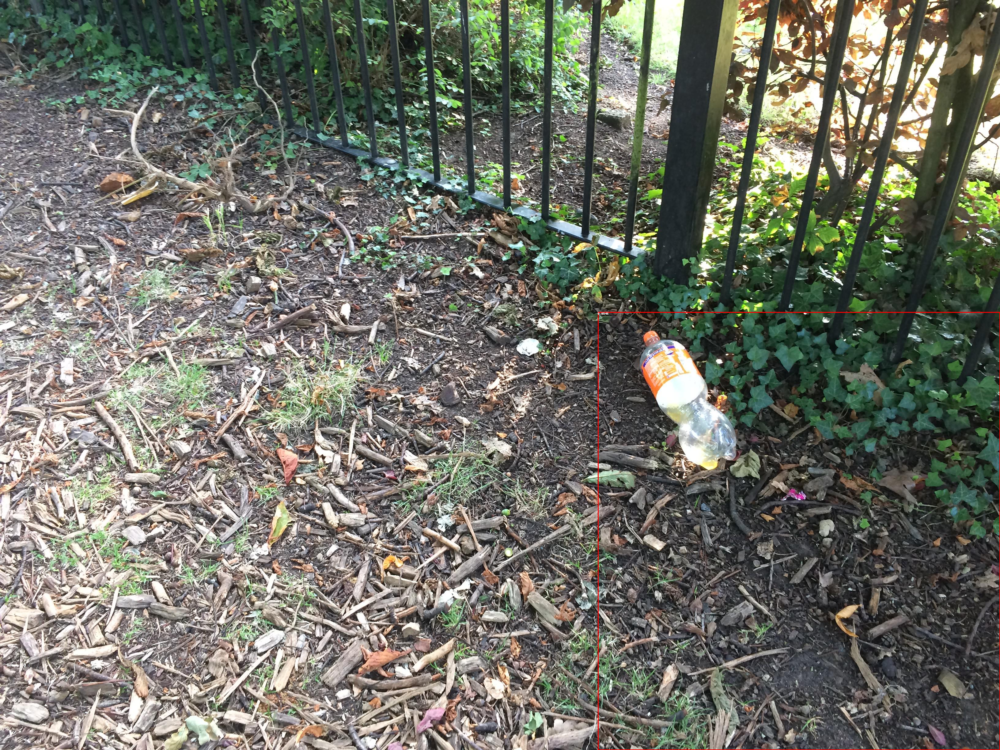

In [20]:
idx = 154
img, _ = dataset_test[idx]
label_boxes = np.array(dataset_test[idx][1]["boxes"])
loaded_model.eval()
with torch.no_grad():
    prediction = loaded_model([img])
image = Image.fromarray(img.mul(255).permute(1, 2,0).byte().numpy())
draw = ImageDraw.Draw(image)
for elem in range(len(label_boxes)):
    draw.rectangle([(label_boxes[elem][0], label_boxes[elem][1]),
    (label_boxes[elem][2], label_boxes[elem][3])], 
    outline ="green", width =3)
for element in range(len(prediction[0]["boxes"])):
    boxes = prediction[0]["boxes"][element].cpu().numpy()
    score = np.round(prediction[0]["scores"][element].cpu().numpy(),
                    decimals= 4)
    print(score)
    if score > 0.8:
        draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])], 
        outline ="red", width =3)
        draw.text((boxes[0], boxes[1]), text = str(score))
image
